# PCA Analysis of Fried, Mukamel, Kreiman (2011) data

In [1]:
import numpy as np

from scipy.optimize import minimize
from scipy.io import loadmat,savemat
from scipy.linalg import fractional_matrix_power
from scipy import interpolate, signal,stats
from scipy.stats import ranksums
from scipy.ndimage.filters import uniform_filter1d
from scipy.ndimage import gaussian_filter1d

from os import listdir

from sklearn.linear_model import LogisticRegression, LinearRegression, ElasticNet, Ridge
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA, FastICA
from sklearn.manifold import TSNE

import pandas as pd


import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits import mplot3d
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib.collections import LineCollection

from pymer4 import Lmer, Lm

import seaborn as sns


In [2]:
# Useful functions
def find_csv_filenames( path_to_dir, suffix=".csv" ):
    filenames = listdir(path_to_dir)
    return [ filename for filename in filenames if filename.endswith( suffix ) ]



In [3]:
fpath = './data_real/'
files = find_csv_filenames(fpath,suffix=".mat")

## Reading in the data
The for-loop below will iterate over all the files that we've extracted, and create a dictionary with the 'subj_session' as the keys, and information about the neurons as the values of the dictionary (neurons X trials X time array). We do this separately for different unique numbers of trials for given subjects & sessions, because otherwise we don't know that the data matches up properly.

In [4]:
temp = loadmat(fpath+files[0])

time_fr = np.arange(-3.45,0,0.05)


data = {}

for file in files:
    temp = loadmat(fpath+file)
    
    key = '_'.join([str(temp['subj'][0][0]),str(temp['session'][0][0]),str(temp['ntrials'][0][0])])
    
    if key not in data.keys():
#         data[key] = [np.empty(temp['FRs'].shape)]
        data[key] = []
    
#     print(key,temp['FRs'].shape,file)
    
#     # On data that's non-overlapping 50 millisecond bins
#     psth = temp['FRs']
#     data[key].append(psth)
    
    # On data that's overlapping 500 ms bins with increments of 25 ms
    psth = uniform_filter1d(temp['StopAlignedSpikes'].astype(float),size=300,mode='reflect')[:,0:-25:25]
    
    # Soft normalization
    if np.max(psth) == 0:
        continue
    else:
        psth = psth / np.sqrt(np.max(psth))
    
    data[key].append(psth)
    
for key in sorted(data.keys()):
#     print([_.shape for _ in data[key]])
    data[key] = np.stack(data[key])

In [5]:
len(files)

1032

In [6]:
# data['6_1'].shape    
# temp['FRs'].shape

nTrials = []

print('Key: Subject, session, number of trials. Then (number of neurons, number of trials, time (50 ms increments)')
for key in sorted(data.keys()):
    print(key,data[key].shape)
    nTrials.append(data[key].shape[1])

Key: Subject, session, number of trials. Then (number of neurons, number of trials, time (50 ms increments)
10_1_54 (36, 54, 140)
10_2_49 (18, 49, 140)
11_1_48 (56, 48, 140)
12_2_93 (10, 93, 140)
1_1_63 (38, 63, 140)
2_1_70 (58, 70, 140)
2_2_61 (56, 61, 140)
3_1_15 (41, 15, 140)
4_1_33 (38, 33, 140)
4_2_46 (42, 46, 140)
4_3_51 (39, 51, 140)
4_4_34 (49, 34, 140)
4_5_40 (42, 40, 140)
4_6_50 (44, 50, 140)
5_1_59 (21, 59, 140)
5_2_43 (24, 43, 140)
5_3_69 (13, 69, 140)
5_4_61 (22, 61, 140)
6_1_20 (48, 20, 140)
6_2_42 (49, 42, 140)
6_3_17 (27, 17, 140)
6_4_21 (58, 21, 140)
7_1_11 (37, 11, 140)
7_2_16 (27, 16, 140)
8_1_65 (43, 65, 140)
8_2_65 (57, 65, 140)
9_1_60 (17, 60, 140)
9_2_62 (20, 62, 140)


## PCA: Extracting Principal components

Taken from Neuromatch 2020 code, the below takes a Neurons X trials X time matrix, reshapes it to be a Neurons X (trials x time) matrix, transposes it and extracts principal components. The components matrix (W) is then taken and multiplied by the reshaped data, then reshaped back into the normal size to visualize the PC activities over time...

In [7]:
data_pca = {}
models_pca = {}

n_components = 10

NT = psth.shape[-1]

frames = []

for key in data.keys():
    
    if (data[key].shape[0] >= 10) & (data[key].shape[1] > 35):
        droll = np.reshape(data[key], (data[key].shape[0],-1)) # first 80 bins = 1.6 sec
        droll = droll - np.mean(droll, axis=1)[:, np.newaxis]
        model = PCA(n_components = n_components).fit(droll.T)
#         model = FastICA(n_components=n_components,max_iter=500,tol=2e-4).fit(droll.T)
        W = model.components_
        pcs = W @ np.reshape(data[key], (data[key].shape[0],-1))
        pcs = np.reshape(pcs, (n_components, -1, NT))
        
        data_pca[key] = pcs
        models_pca[key] = model
        
        frames.append(data[key][:,:40,:])

In [8]:
for key in sorted(data_pca.keys()):
    print(key,'\nnumber neurons: ',data[key].shape[0],'\nnumber trials: ',data_pca[key].shape[1])

10_1_54 
number neurons:  36 
number trials:  54
10_2_49 
number neurons:  18 
number trials:  49
11_1_48 
number neurons:  56 
number trials:  48
12_2_93 
number neurons:  10 
number trials:  93
1_1_63 
number neurons:  38 
number trials:  63
2_1_70 
number neurons:  58 
number trials:  70
2_2_61 
number neurons:  56 
number trials:  61
4_2_46 
number neurons:  42 
number trials:  46
4_3_51 
number neurons:  39 
number trials:  51
4_5_40 
number neurons:  42 
number trials:  40
4_6_50 
number neurons:  44 
number trials:  50
5_1_59 
number neurons:  21 
number trials:  59
5_2_43 
number neurons:  24 
number trials:  43
5_3_69 
number neurons:  13 
number trials:  69
5_4_61 
number neurons:  22 
number trials:  61
6_2_42 
number neurons:  49 
number trials:  42
8_1_65 
number neurons:  43 
number trials:  65
8_2_65 
number neurons:  57 
number trials:  65
9_1_60 
number neurons:  17 
number trials:  60
9_2_62 
number neurons:  20 
number trials:  62


## Proportion of Explained Variance

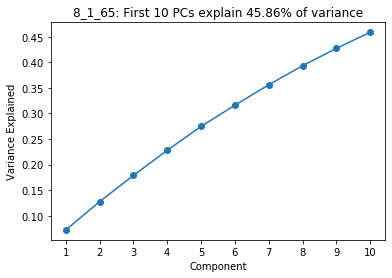

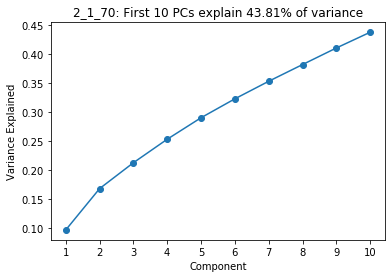

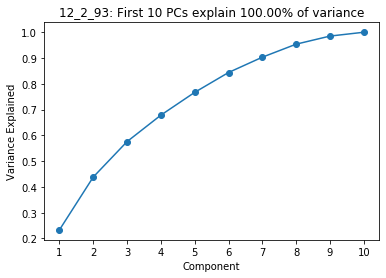

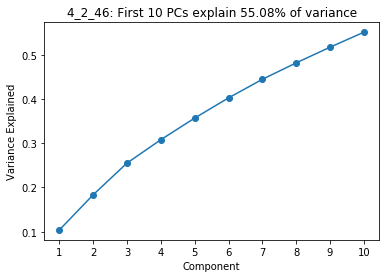

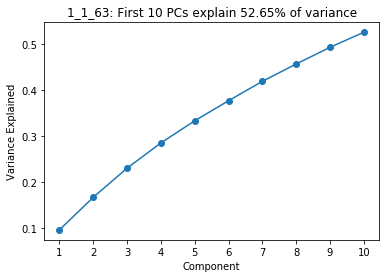

...

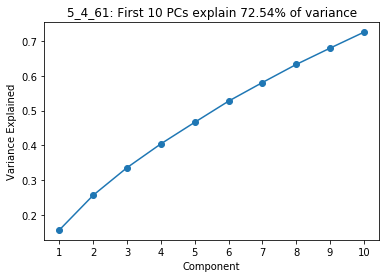

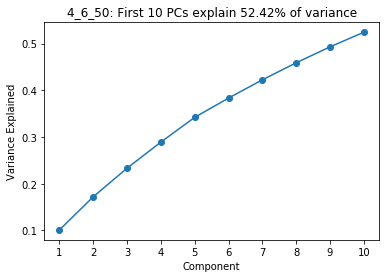

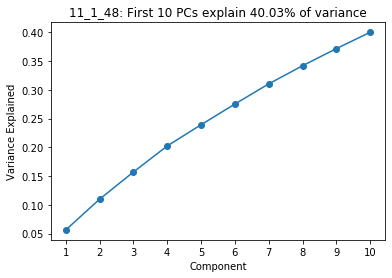

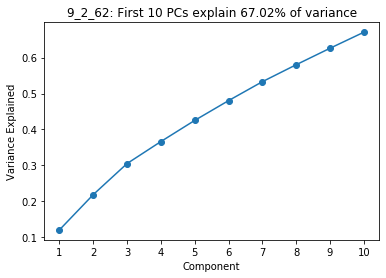

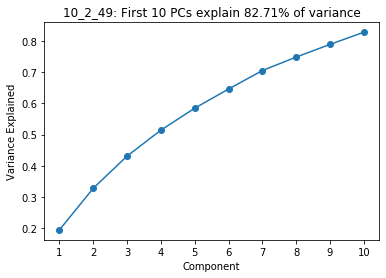

In [34]:
plotiter = 1
for key in data_pca.keys():
    
# key = '6_1_20'
    

# ax = plt.subplots(len(data_pca.keys()),1,plotiter)
    plt.figure(figsize=(6,4))
    plt.plot(np.arange(1,11),np.cumsum(models_pca[key].explained_variance_ratio_),marker='o')
    plt.title(key+f": First 10 PCs explain {models_pca[key].explained_variance_ratio_.sum():.2%} of variance")
    plt.xticks(np.arange(1,11))
    # plt.yticks([0.02,0.03,0.04,0.05,0.06,0.07],["2%","3%","4%","5%","6%","7%"])
    plt.xlabel("Component")
    plt.ylabel("Variance Explained")
    
    plotiter += 1

## Progression of PC mean over time

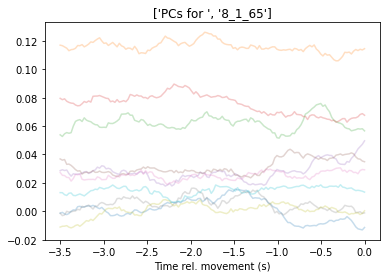

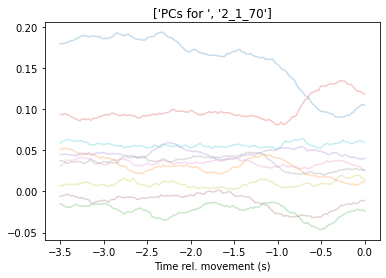

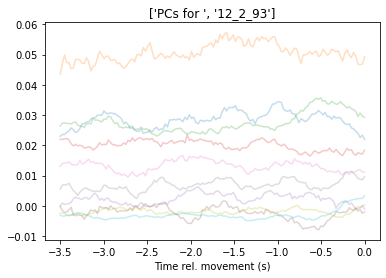

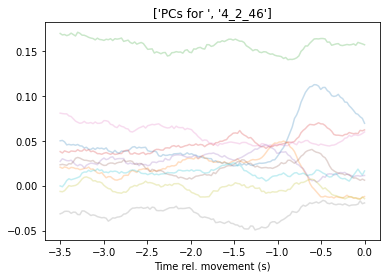

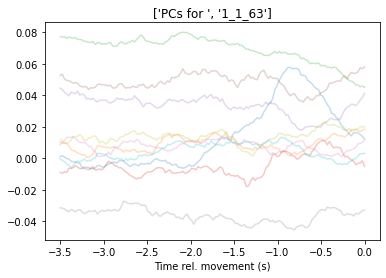

...

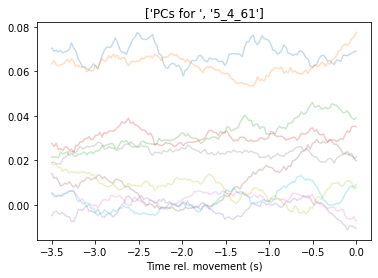

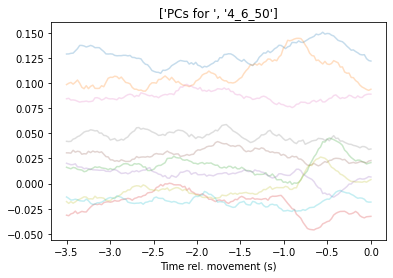

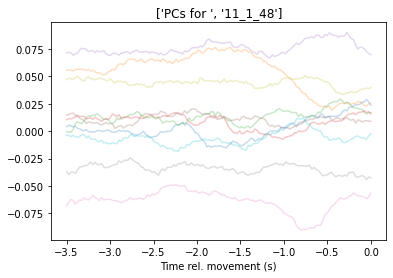

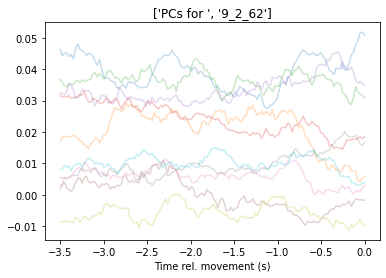

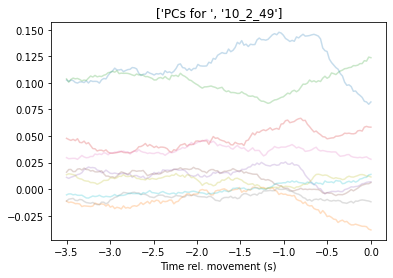

In [76]:
plotiter = 1
for key in data_pca.keys():
    plt.figure(figsize=(6,4))

  
    plt.plot(np.linspace(-3.5,0,NT),data_pca[key].mean(axis=1).T,alpha=0.25);
    plt.xlabel('Time rel. movement (s)')
#     plt.legend(['1','2','3','4','5'])
    plt.title(['PCs for ',key])

In [77]:
data_pca[key].mean(axis=1).shape

(10, 140)

## Extract information about each PC, compare it -2.5 to -1.5 (baseline) to pre-movement activity

In [78]:
keys = []
num_neurons = []
num_trials = []

comp_numbers = []
exp_variance = []

rsstats = []
pvals = []

pctypes = []

pcs = []

time_fr = np.linspace(-3.5,0,NT)


base_ix = (time_fr >= -2.5) & (time_fr < -1.5)

cf_ix = time_fr > -0.4

for key in sorted(data_pca.keys()):
    for i in range(data_pca[key].shape[0]):
        
        temp = data_pca[key][i,:,:].squeeze()
        
        keys.append(key)
        num_neurons.append(data[key].shape[0])
        num_trials.append(data_pca[key].shape[1])
        
        comp_numbers.append(i)
        exp_variance.append(models_pca[key].explained_variance_ratio_[i])
#         exp_variance.append(np.nan)
        
        
        stat,pval = ranksums(temp[:,cf_ix].mean(axis=1),temp[:,base_ix].mean(axis=1))
        
        rsstats.append(stat)
        pvals.append(pval)
        
        if pval > 0.01:
            pctypes.append('non')
        elif stat > 0:
            pctypes.append('inc')
        elif stat < 0:
            pctypes.append('dec')
        pcs.append(temp)
            

df = pd.DataFrame()

df['key'] = keys
df['num_neurons'] = num_neurons
df['num_trials'] = num_trials
df['comp_number'] = comp_numbers
df['exp_variance'] = exp_variance
df['stat'] = rsstats
df['pval'] = pvals
df['type'] = pctypes
df['pc'] = pcs

        
df.head()
        

,key,num_neurons,num_trials,comp_number,exp_variance,stat,pval,type,pc
0,10_1_54,36,54,0,0.084743,7.275039,3.463208e-13,inc,"[[0.023962216426313094, 0.035960621298757635, ..."
1,10_1_54,36,54,1,0.057762,0.718902,4.722015e-01,non,"[[0.07092785959011247, 0.08075625743180703, 0...."
2,10_1_54,36,54,2,0.055346,-4.632922,3.605409e-06,dec,"[[0.024152630091807455, 0.023252315611865446, ..."
3,10_1_54,36,54,3,0.054557,-0.356379,7.215571e-01,non,"[[0.007455625187451389, 0.008591524259675985, ..."
4,10_1_54,36,54,4,0.047217,-0.841791,3.999051e-01,non,"[[0.08421210187970768, 0.06785283724091885, 0...."


In [79]:
# df.type.value_counts()
df.pc.values[0].shape


df['pc_mean'] = [np.mean(pc,0) for pc in df.pc.values]
df['dist'] = [np.abs(df.pc.values[ii] - df.pc_mean.values[ii]).mean(axis=0) for ii in range(len(df))]
df['variance'] = [np.var(df.pc.values[ii] - df.pc_mean.values[ii],axis=0) for ii in range(len(df))]
df['relvariance'] = [df['variance'].values[ii]/np.abs(df['pc_mean'].values[ii]) for ii in range(len(df))]


In [80]:
np.var(df.pc.values[0] - df.pc_mean.values[0],axis=0)/np.abs(df['pc_mean'].values[0])

array([0.06013838, 0.05965032, 0.05547461, 0.04591902, 0.04861627,
       0.04014285, 0.0358217 , 0.03382405, 0.03106792, 0.03273776,
       0.03256658, 0.03220643, 0.03096763, 0.03059309, 0.03435402,
       0.03550521, 0.03211773, 0.03622586, 0.03849002, 0.03736027,
       0.03871438, 0.04227041, 0.04442062, 0.04029748, 0.03753459,
       0.03668005, 0.03648658, 0.03614539, 0.03810123, 0.04106356,
       0.03620294, 0.03499885, 0.03624081, 0.0394264 , 0.04269831,
       0.0457913 , 0.04542902, 0.03789512, 0.03729989, 0.03861256,
       0.0367231 , 0.03625844, 0.03713391, 0.03668781, 0.03586528,
       0.03725621, 0.03607218, 0.03195524, 0.03568313, 0.0404671 ,
       0.04069588, 0.04036552, 0.03775174, 0.03905894, 0.04243749,
       0.04326664, 0.04155679, 0.03980203, 0.03834898, 0.03847732,
       0.03607205, 0.03471885, 0.03439215, 0.03540519, 0.03772711,
       0.03569038, 0.03564263, 0.03041111, 0.02876402, 0.03077125,
       0.02866391, 0.02587026, 0.02502572, 0.023174  , 0.02576

## Plot the increasing/decreasing PCs and see if they have similar ramping on every trial

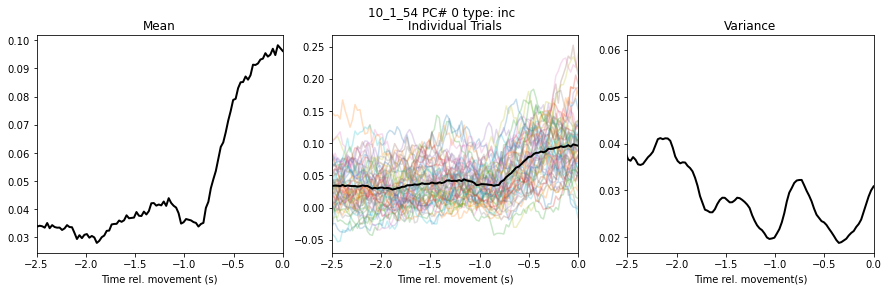

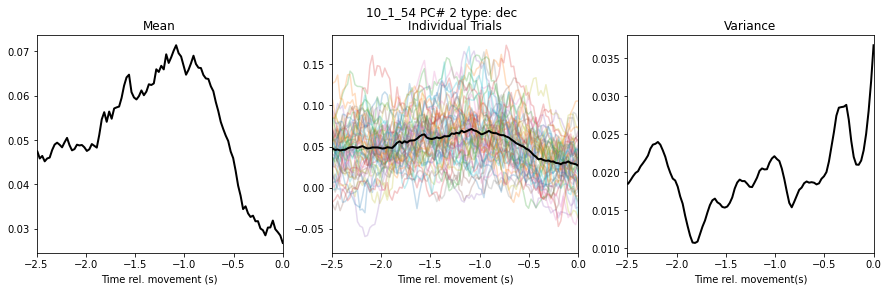

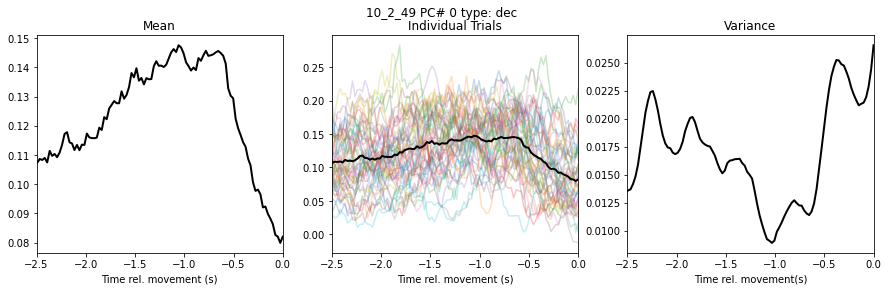

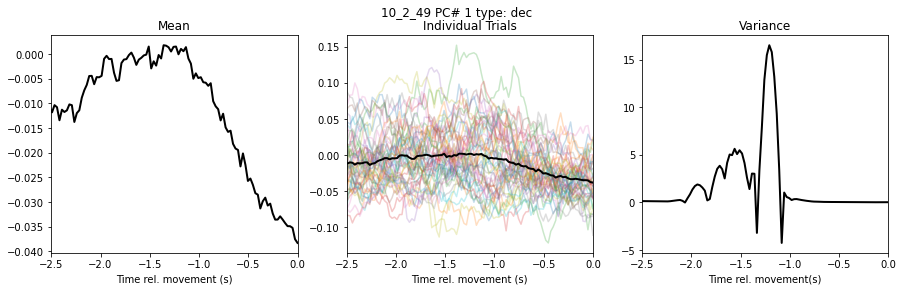

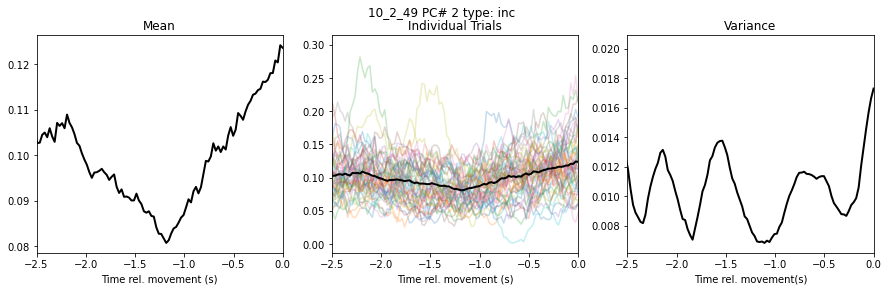

...

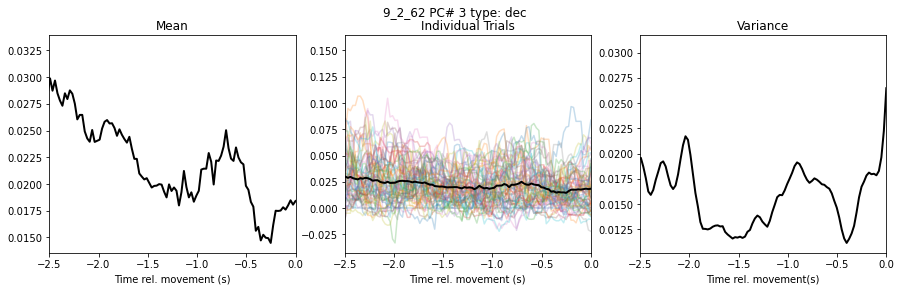

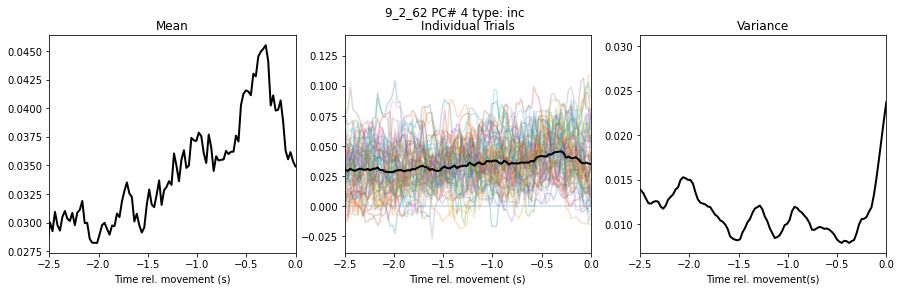

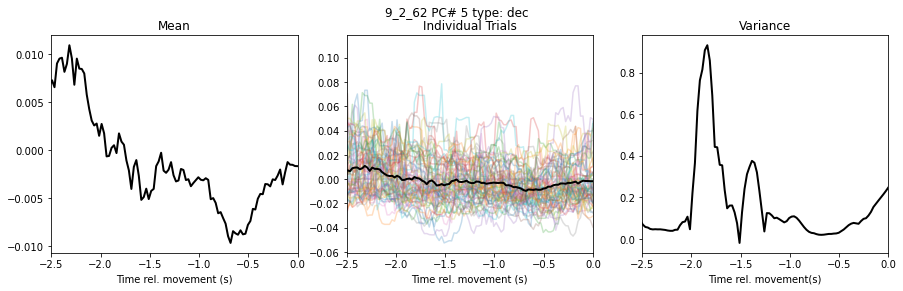

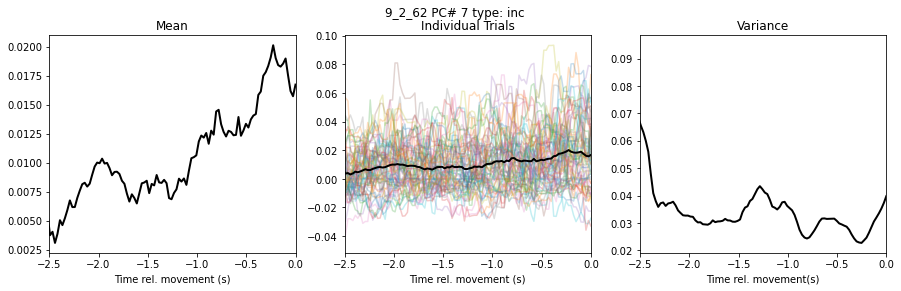

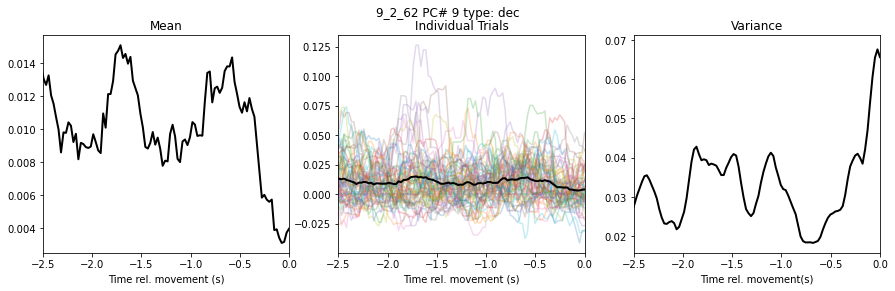

In [81]:
dynamics = []
for i in range(len(df.type.values)):
    if df.type.values[i] != 'non':
        
        
        fig, axs = plt.subplots(1,3,figsize=(15,4),sharex=True)
        
        # Smoothing
#         axs[0].plot(time_fr,signal.savgol_filter(df.pc.values[i],11,3,axis=1).mean(axis=0),'k',lw=2)
#         axs[1].plot(time_fr,signal.savgol_filter(df.pc.values[i],11,3,axis=1).T,alpha=0.25)
#         axs[1].plot(time_fr,signal.savgol_filter(df.pc.values[i],11,3,axis=1).mean(axis=0),'k',lw=2)

        # No smoothing
        axs[0].plot(time_fr,df.pc.values[i].mean(axis=0),'k',lw=2)
        axs[1].plot(time_fr,df.pc.values[i].T,alpha=0.25)
        axs[1].plot(time_fr,df.pc.values[i].mean(axis=0),'k',lw=2)
        
        axs[0].set_xlim((-2.5,0))

        axs[0].set_xlabel('Time rel. movement (s)')
        axs[1].set_xlabel('Time rel. movement (s)')

        axs[0].set_title('Mean')
        axs[1].set_title('Individual Trials')
        
        axs[2].plot(time_fr,signal.savgol_filter(df['relvariance'].values[i],11,3),'k',lw=2)
        axs[2].set_title('Variance')
        axs[2].set_xlabel('Time rel. movement(s)')
        plt.suptitle(' '.join([df.key.values[i],'PC#',str(df.comp_number.values[i]),'type:',str(df.type.values[i])]))
        
        plt.show()
        
        ## Automatic
        
        

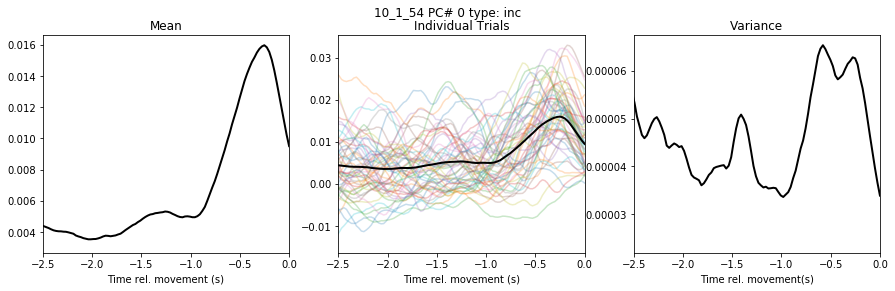

KeyboardInterrupt: 

In [69]:
## This one will ask / prompt for an answer about the stepping / non-stepping dynamics on each trial

dynamics = []
for i in range(len(df.type.values)):
    if df.type.values[i] != 'non':
        
        
        fig, axs = plt.subplots(1,3,figsize=(15,4),sharex=True)
        
        # Smoothing
        axs[0].plot(time_fr,signal.savgol_filter(df.pc.values[i],11,3,axis=1).mean(axis=0),'k',lw=2)
        axs[1].plot(time_fr,signal.savgol_filter(df.pc.values[i],11,3,axis=1).T,alpha=0.25)
        axs[1].plot(time_fr,signal.savgol_filter(df.pc.values[i],11,3,axis=1).mean(axis=0),'k',lw=2)

        # No smoothing
#         axs[0].plot(time_fr,df.pc.values[i].mean(axis=0),'k',lw=2)
#         axs[1].plot(time_fr,df.pc.values[i].T,alpha=0.25)
#         axs[1].plot(time_fr,df.pc.values[i].mean(axis=0),'k',lw=2)
        
        axs[0].set_xlim((-2.5,0))
        axs[1].set_xlim((-2.5,0))
        axs[2].set_xlim((-2.5,0))

        axs[0].set_xlabel('Time rel. movement (s)')
        axs[1].set_xlabel('Time rel. movement (s)')

        axs[0].set_title('Mean')
        axs[1].set_title('Individual Trials')
        
        axs[2].plot(time_fr,signal.savgol_filter(df['variance'].values[i],11,3),'k',lw=2)
        axs[2].set_title('Variance')
        axs[2].set_xlabel('Time rel. movement(s)')
        plt.suptitle(' '.join([df.key.values[i],'PC#',str(df.comp_number.values[i]),'type:',str(df.type.values[i])]))
        
        plt.show()
        
        ## Automatic
        xx = input('what type of dynamics?')
        dynamics.append(xx)
    else:
        dynamics.append(np.nan)

## Aggregating the data over all subjects, no prior taking mean values

Above we've taken ever subject's data that had more than 35 trials (min 40), taken the first 40 trials, and aggregated them. Now, using the aggregated data we'll plot the data over time...



In [9]:
data_pca = {}
models_pca = {}

n_components = 10

NT = psth.shape[-1]

frames = []

for key in data.keys():
    
    if (data[key].shape[0] >= 10) & (data[key].shape[1] > 35):
        
        frames.append(data[key][:,:40,:])

In [10]:
agdata = np.concatenate(frames,axis=0)

n_components = 20
droll = np.reshape(agdata, (agdata.shape[0],-1)) # first 80 bins = 1.6 sec
droll = droll - np.mean(droll, axis=1)[:, np.newaxis]
model = PCA(n_components = n_components).fit(droll.T)
#         model = FastICA(n_components=n_components,max_iter=500,tol=2e-4).fit(droll.T)
W = model.components_
pcs = W @ np.reshape(agdata, (agdata.shape[0],-1))
pcs = np.reshape(pcs, (n_components, -1, NT))

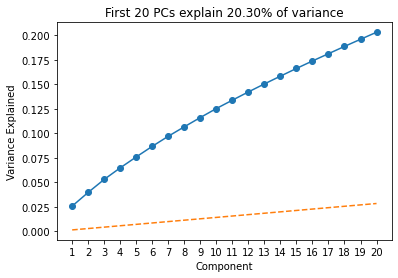

In [11]:

plt.figure(figsize=(6,4))
plt.plot(np.arange(1,n_components+1),np.cumsum(model.explained_variance_ratio_),marker='o')
plt.title(f"First {n_components} PCs explain {model.explained_variance_ratio_.sum():.2%} of variance")
plt.xticks(np.arange(1,n_components+1))
plt.plot(np.arange(1,n_components+1),np.arange(1,n_components+1)/(agdata.shape[0]),'--')
# plt.yticks([0.02,0.03,0.04,0.05,0.06,0.07],["2%","3%","4%","5%","6%","7%"])
plt.xlabel("Component")
plt.ylabel("Variance Explained")

plt.show()

In [12]:
pcs.shape

(20, 40, 140)

ERROR! Session/line number was not unique in database. History logging moved to new session 3161


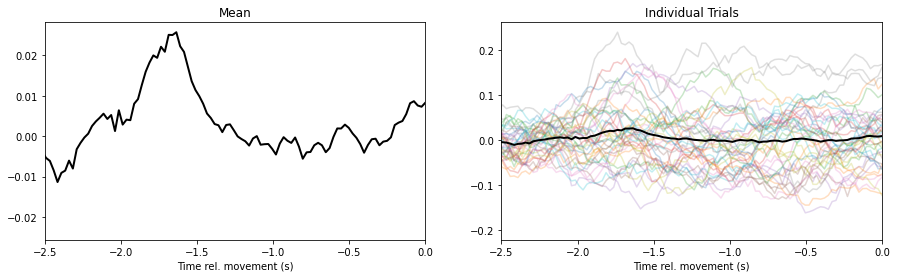

In [24]:
i = 4

time_fr = np.linspace(-3.5,0,NT)


pc = pcs[i].squeeze()
pc = pc - pc[:,20:60].mean(axis=1)[:,np.newaxis]

fig, axs = plt.subplots(1,2,figsize=(15,4),sharex=True)
        
# Smoothing
# axs[0].plot(time_fr,gaussian_filter1d(pc,3,axis=1).mean(axis=0),'k',lw=2)
# axs[1].plot(time_fr,gaussian_filter1d(pc,3,axis=1).T,alpha=0.25)
# axs[1].plot(time_fr,gaussian_filter1d(pc,3,axis=1).mean(axis=0),'k',lw=2)

# No smoothing
axs[0].plot(time_fr,pc.mean(axis=0),'k',lw=2)
axs[1].plot(time_fr,pc.T,alpha=0.25)
axs[1].plot(time_fr,pc.mean(axis=0),'k',lw=2)

axs[0].set_xlim((-2.5,0.0))

axs[0].set_xlabel('Time rel. movement (s)')
axs[1].set_xlabel('Time rel. movement (s)')

axs[0].set_title('Mean')
axs[1].set_title('Individual Trials')


# plt.suptitle(' '.join([df.key.values[i],'PC#',str(df.comp_number.values[i]),'type:',str(df.type.values[i])]))

plt.show()

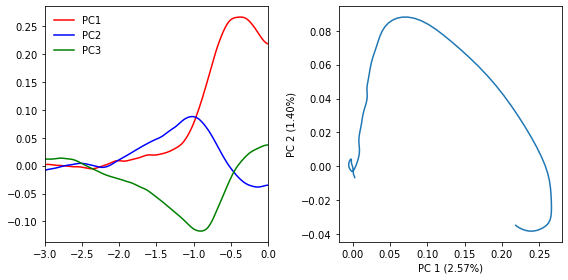

In [25]:
pc1 = pcs[0]
pc1 = pc1 - pc1[:,20:60].mean(axis=1)[:,np.newaxis]

pc2 = pcs[1]
pc2 = pc2 - pc2[:,20:60].mean(axis=1)[:,np.newaxis]

pc3 = pcs[2]
pc3 = pc3 - pc3[:,20:60].mean(axis=1)[:,np.newaxis]

fig, axs = plt.subplots(1,2,figsize=(8,4))

axs[0].plot(time_fr,gaussian_filter1d(pc1,sigma=2,axis=1).mean(axis=0),'r',label='PC1')
axs[0].plot(time_fr,gaussian_filter1d(pc2,sigma=2,axis=1).mean(axis=0),'b',label='PC2')
axs[0].plot(time_fr,gaussian_filter1d(pc3,sigma=2,axis=1).mean(axis=0),'g',label='PC3')
axs[0].set_xlim((-3,0))
axs[0].legend(frameon=False)


axs[1].plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0))
axs[1].set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})")
axs[1].set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})")

plt.tight_layout()
plt.show()

In [26]:
frames = []
pc_list = [pc1,pc2,pc3]


for ii in range(len(pc_list)):
    df_temp = pd.DataFrame({
        'pc':pc_list[ii].reshape(1,-1).T.squeeze(),
        'time':np.tile(time_fr,pc_list[ii].shape[0]),
        'num':f"PC {ii+1}"                          
    })
    frames.append(df_temp)
    
df = pd.concat(frames).reset_index()

df

,index,pc,time,num
0,0,0.029704,-3.500000,PC 1
1,1,0.045685,-3.474820,PC 1
2,2,0.046910,-3.449640,PC 1
3,3,0.063422,-3.424460,PC 1
4,4,0.055816,-3.399281,PC 1
...,...,...,...,...
16795,5595,0.039775,-0.100719,PC 3
16796,5596,0.036964,-0.075540,PC 3
16797,5597,0.019374,-0.050360,PC 3
16798,5598,0.027538,-0.025180,PC 3


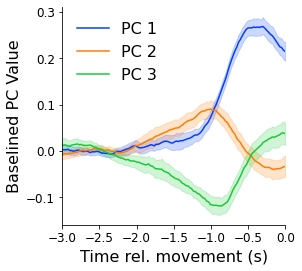

In [30]:
fig, ax = plt.subplots(figsize=(4,4))
sns.lineplot(data=df, x="time", y="pc",
             hue='num',palette = 'bright',ci=95)
sns.despine()

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(12)
    
ax.set_xlim((-3,0))
legend = ax.legend(frameon=False,loc='upper left',
         prop={'size':16})
# legend.legendHandles[0]._legmarker.set_markersize(15)

ax.set_xlabel('Time rel. movement (s)',fontsize=16)
ax.set_ylabel('Baselined PC Value',fontsize=16)

ax.axhline(0,-3,0,linewidth=2)


plt.show()

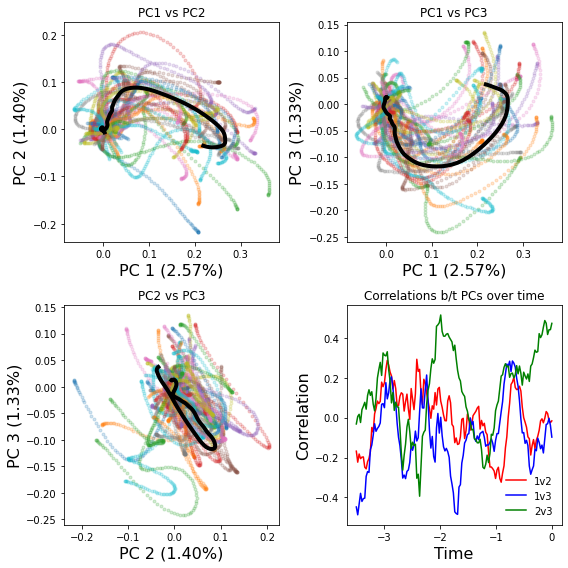

In [62]:
fig, axs = plt.subplots(2,2,figsize=(8,8))

for ii in range(pc1.shape[0]):
    axs[0,0].plot(gaussian_filter1d(pc1,sigma=10,axis=1)[ii,20:],gaussian_filter1d(pc2,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)

#     axs.plot(gaussian_filter1d(pc1,sigma=2,axis=1)[ii,20:],gaussian_filter1d(pc2,sigma=2,axis=1)[ii,20:],'.',alpha=0.2)


axs[0,0].plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
              gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
              'k',linewidth=4)

    
axs[0,0].set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
axs[0,0].set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
axs[0,0].set_title('PC1 vs PC2')


# Axs 2: PC 1 vs PC 3
for ii in range(pc1.shape[0]):
    axs[0,1].plot(gaussian_filter1d(pc1,sigma=10,axis=1)[ii,20:],gaussian_filter1d(pc3,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)

#     axs.plot(gaussian_filter1d(pc1,sigma=2,axis=1)[ii,20:],gaussian_filter1d(pc2,sigma=2,axis=1)[ii,20:],'.',alpha=0.2)


axs[0,1].plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
              gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0),
              'k',linewidth=4)

    
axs[0,1].set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
axs[0,1].set_ylabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
axs[0,1].set_title('PC1 vs PC3')

# Axs 3: PC 2 vs PC 3
for ii in range(pc1.shape[0]):
    axs[1,0].plot(gaussian_filter1d(pc2,sigma=10,axis=1)[ii,20:],gaussian_filter1d(pc3,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)


axs[1,0].plot(gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
              gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0),
              'k',linewidth=4)

    
axs[1,0].set_xlabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
axs[1,0].set_ylabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
axs[1,0].set_title('PC2 vs PC3')


## Axs 4: Time-dependent correlations 

pc1v2 = []
for ii in range(pc1.shape[1]):
    pc1v2.append(np.corrcoef(pc1[:,ii].T,pc2[:,ii].T)[1,0])
    
pc1v3 = []
for ii in range(pc1.shape[1]):
    pc1v3.append(np.corrcoef(pc1[:,ii].T,pc3[:,ii].T)[1,0])
    
pc2v3 = []
for ii in range(pc1.shape[1]):
    pc2v3.append(np.corrcoef(pc2[:,ii].T,pc3[:,ii].T)[1,0])
    
axs[1,1].plot(time_fr,pc1v2,'r',label='1v2')
axs[1,1].plot(time_fr,pc1v3,'b',label='1v3')
axs[1,1].plot(time_fr,pc2v3,'g',label='2v3')

axs[1,1].legend(frameon=False)
axs[1,1].set_xlabel("Time",fontsize=16)
axs[1,1].set_ylabel("Correlation",fontsize=16)
axs[1,1].set_title('Correlations b/t PCs over time')


fig.tight_layout()
plt.show()

In [17]:
## Correlation Analysis

# PC1 vs PC2

# pc12cor = np.corrcoef(pc1.reshape(1,-1),pc2.reshape(1,-1))
# pc13cor = np.corrcoef(pc1.reshape(1,-1),pc3.reshape(1,-1))
# pc23cor = np.corrcoef(pc2.reshape(1,-1),pc3.reshape(1,-1))

# df_pcs = pd.DataFrame({
#     'PC1':pc1.reshape(1,-1).flatten(),
#     'PC2':pc2.reshape(1,-1).flatten(),
#     'PC3':pc3.reshape(1,-1).flatten(),
#     'time':np.tile(time_fr,pc1.shape[0]),
#     'trial':np.tile(np.arange(pc1.shape[0]).reshape(-1,1),pc1.shape[1]).reshape(1,-1).flatten() + 1
# })

df_pcs = pd.DataFrame({
    'PC1':pc1[:,np.where(np.abs(time_fr + 0.5) == np.min(np.abs(time_fr + 0.5)))[0]].flatten(),
    'PC2':pc2[:,np.where(np.abs(time_fr + 1) == np.min(np.abs(time_fr + 1)))[0]].flatten(),
    'PC3':pc3[:,np.where(np.abs(time_fr + 1) == np.min(np.abs(time_fr + 1)))[0]].flatten(),
    'trial':np.arange(1,41)
})




In [18]:
model12 = Lm('PC1 ~ PC2 ',data=df_pcs)

print(model12.fit())

model13 = Lm('PC1 ~ PC3  ',data=df_pcs)

print(model13.fit())

model23 = Lm('PC2 ~ PC3 ',data=df_pcs)

print(model23.fit())

Formula: PC1~PC2

Family: gaussian	 Estimator: OLS

Std-errors: non-robust	CIs: standard 95%	Inference: parametric 

Number of observations: 40	 R^2: 0.004	 R^2_adj: -0.023

Log-likelihood: 60.606 	 AIC: -117.212	 BIC: -113.834

Fixed effects:

           Estimate  2.5_ci  97.5_ci     SE  DF  T-stat  P-val  Sig
Intercept     0.260   0.228    0.292  0.016  38  16.618  0.000  ***
PC2           0.054  -0.239    0.347  0.145  38   0.373  0.711     
Formula: PC1~PC3

Family: gaussian	 Estimator: OLS

Std-errors: non-robust	CIs: standard 95%	Inference: parametric 

Number of observations: 40	 R^2: 0.026	 R^2_adj: 0.000

Log-likelihood: 61.057 	 AIC: -118.114	 BIC: -114.737

Fixed effects:

           Estimate  2.5_ci  97.5_ci     SE  DF  T-stat  P-val  Sig
Intercept     0.282   0.244    0.320  0.019  38  15.060  0.000  ***
PC3           0.145  -0.147    0.436  0.144  38   1.005  0.321     
Formula: PC2~PC3

Family: gaussian	 Estimator: OLS

Std-errors: non-robust	CIs: standard 95%	Inference:

/var/folders/yf/4w_d87yd2839wcjcx53kmbn40000gn/T/ipykernel_81071/2008149804.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


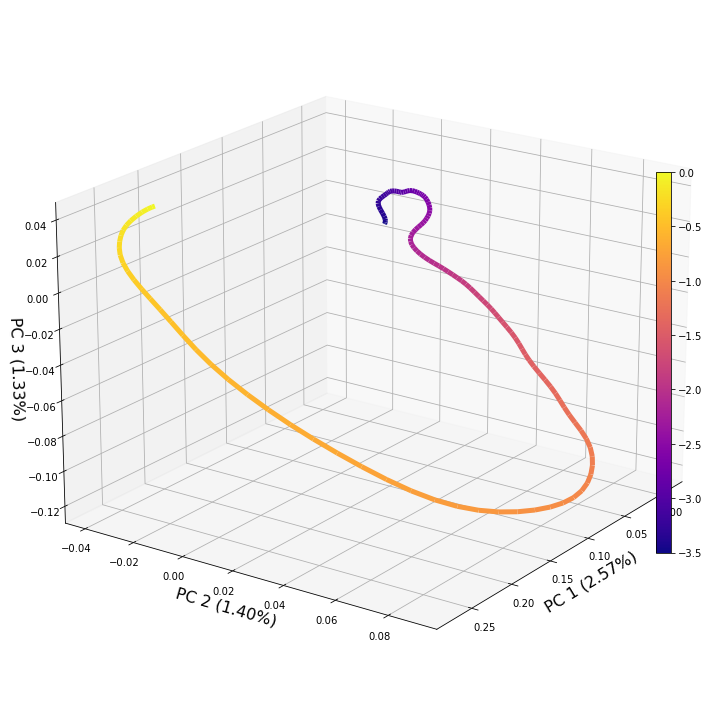

In [19]:
fig = plt.figure(figsize=(10,10))

ax = plt.axes(projection = '3d')

pc1_filt = gaussian_filter1d(pc1,sigma=2,axis=1).mean(axis=0)
pc2_filt = gaussian_filter1d(pc2,sigma=2,axis=1).mean(axis=0)
pc3_filt = gaussian_filter1d(pc3,sigma=2,axis=1).mean(axis=0)

points = np.array([pc1_filt, pc2_filt, pc3_filt]).T.reshape(-1,1,3)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

norm = plt.Normalize(time_fr.min(), time_fr.max())
lc = Line3DCollection(segments, cmap='plasma',norm=norm)

lc.set_array(time_fr)
lc.set_linewidth(5)

line = ax.add_collection(lc)

# ax.plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
#         gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
#         gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0))

ax.set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
ax.set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
ax.set_zlabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
ax.set_xlim((np.min(pc1_filt)-np.std(pc1_filt)*0.2,np.max(pc1_filt)+np.std(pc1_filt)*0.2))
ax.set_ylim((np.min(pc2_filt)-np.std(pc2_filt)*0.2,np.max(pc2_filt)+np.std(pc2_filt)*0.2))
ax.set_zlim((np.min(pc3_filt)-np.std(pc3_filt)*0.2,np.max(pc3_filt)+np.std(pc3_filt)*0.2))

cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().height*0.3,0.02,ax.get_position().height*0.7])
plt.colorbar(line, cax=cax) # Similar to fig.colorbar(im, cax = cax)

ax.view_init(20, 35)

fig.tight_layout()

plt.show()

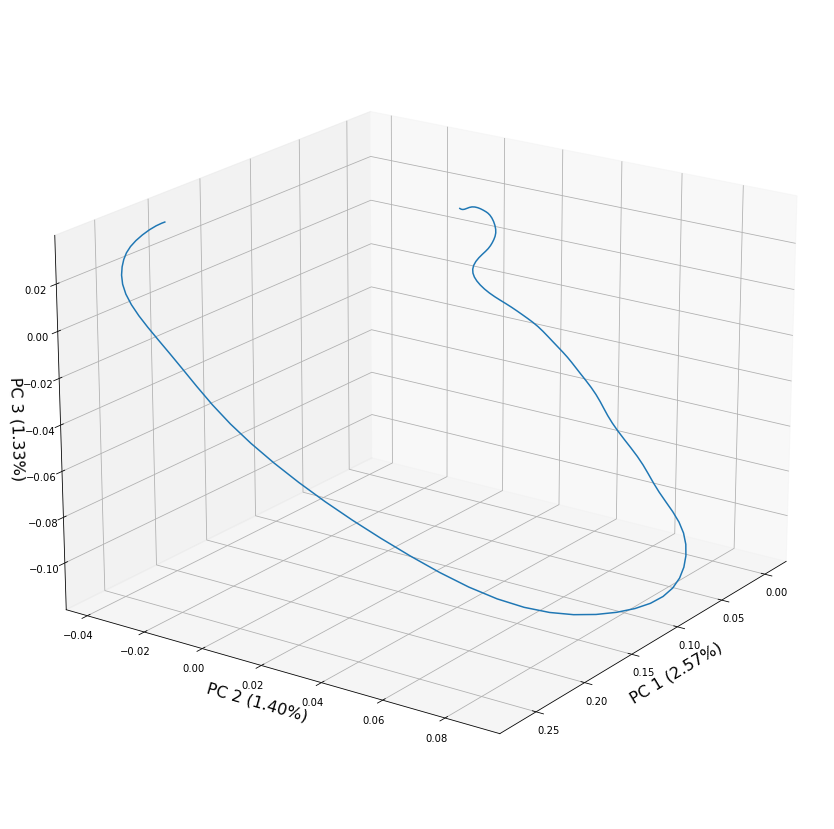

In [65]:
fig = plt.figure(figsize=(15,15))

ax = plt.axes(projection = '3d')

ax.plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0))

ax.set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
ax.set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
ax.set_zlabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
ax.view_init(20, 35)

plt.show()

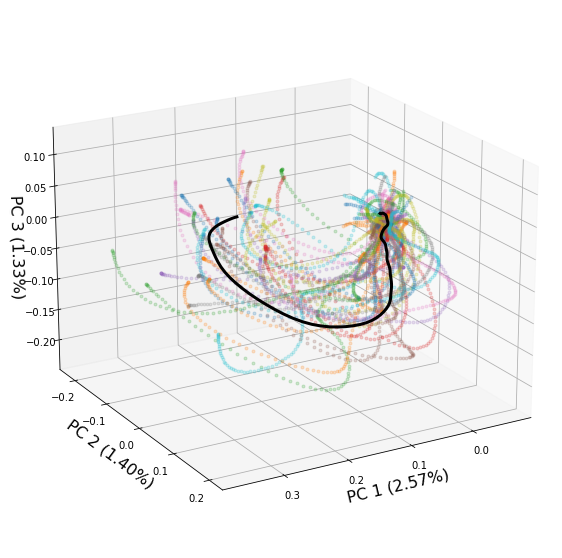

In [66]:
fig = plt.figure(figsize=(10,10))

ax = plt.axes(projection = '3d')

for ii in range(pc1.shape[0]):
    ax.plot(gaussian_filter1d(pc1,sigma=10,axis=1)[ii,20:],
                gaussian_filter1d(pc2,sigma=10,axis=1)[ii,20:],
                gaussian_filter1d(pc3,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)
    
ax.plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0),'k',linewidth=3)

ax.set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
ax.set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
ax.set_zlabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
ax.view_init(20, 60)

/var/folders/yf/4w_d87yd2839wcjcx53kmbn40000gn/T/ipykernel_81071/3081707482.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


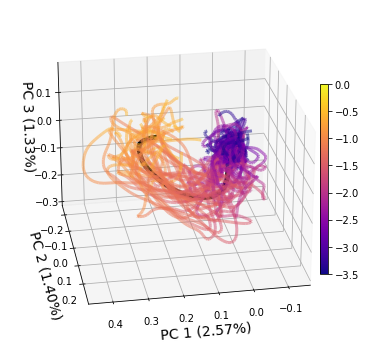

In [22]:
fig = plt.figure(figsize=(5,5))

ax = plt.axes(projection = '3d')

lines = []
for ii in range(pc1.shape[0]):
    pc1_filt = gaussian_filter1d(pc1,sigma=2,axis=1)[ii,20:]
    pc2_filt = gaussian_filter1d(pc2,sigma=2,axis=1)[ii,20:]
    pc3_filt = gaussian_filter1d(pc3,sigma=2,axis=1)[ii,20:]

    points = np.array([pc1_filt, pc2_filt, pc3_filt]).T.reshape(-1,1,3)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    norm = plt.Normalize(time_fr.min(), time_fr.max())
    lc = Line3DCollection(segments, cmap='plasma',norm=norm)

    lc.set_array(time_fr)
    lc.set_linewidth(3)
    lc.set_alpha(0.5)

    lines.append(ax.add_collection(lc))

ax.plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0),'k',linewidth=5,alpha=1)

ax.set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=14)
ax.set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=14)
ax.set_zlabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=14)
ax.set_xlim((np.min(pc1)-np.std(pc1)*0.2,np.max(pc1)+np.std(pc1)*0.2))
ax.set_ylim((np.min(pc2)-np.std(pc2)*0.2,np.max(pc2)+np.std(pc2)*0.2))
ax.set_zlim((np.min(pc3)-np.std(pc3)*0.2,np.max(pc3)+np.std(pc3)*0.2))

cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().height*0.3,0.02,ax.get_position().height*0.7])
plt.colorbar(line, cax=cax) # Similar to fig.colorbar(im, cax = cax)

ax.view_init(25, 80)

fig.tight_layout()

plt.show()

## As in Fu et al., 2022, average data first and then calculate PCA

In [49]:
data_pca = {}
models_pca = {}

n_components = 10

NT = psth.shape[-1]

frames = []

for key in data.keys():
    
    if (data[key].shape[0] >= 10) & (data[key].shape[1] > 35):
        frames.append(data[key].mean(axis=1))

In [50]:
agdata = np.concatenate(frames,axis=0)
n_components = 20
droll = np.reshape(agdata, (agdata.shape[0],-1)) # first 80 bins = 1.6 sec
droll = droll - np.mean(droll, axis=1)[:, np.newaxis]
model = PCA(n_components = n_components).fit(droll.T)
#         model = FastICA(n_components=n_components,max_iter=500,tol=2e-4).fit(droll.T)
W = model.components_
pcs = W @ np.reshape(agdata, (agdata.shape[0],-1))
pcs = np.reshape(pcs, (n_components, NT))

NameError: name 'p' is not defined

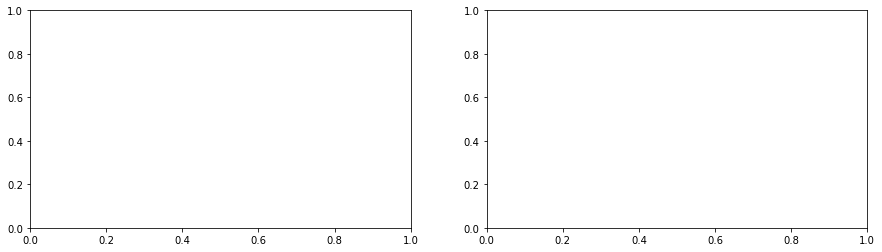

In [51]:
i = 2

pc = pcs[i,:]
pc = pc - pc[20:60].mean()

fig, axs = plt.subplots(1,2,figsize=(15,4),sharex=True)
        
# Smoothing
# axs[0].plot(time_fr,gaussian_filter1d(pc,3,axis=1).mean(axis=0),'k',lw=2)
# axs[1].plot(time_fr,gaussian_filter1d(pc,3,axis=1).T,alpha=0.25)
# axs[1].plot(time_fr,gaussian_filter1d(pc,3,axis=1).mean(axis=0),'k',lw=2)

# No smoothing
axs[0].plot(time_fr,p.mean(axis=0),'k',lw=2)
axs[1].plot(time_fr,df.pc.values[i].T,alpha=0.25)
axs[1].plot(time_fr,df.pc.values[i].mean(axis=0),'k',lw=2)

axs[0].set_xlim((-2.5,0))

axs[0].set_xlabel('Time rel. movement (s)')
axs[1].set_xlabel('Time rel. movement (s)')

axs[0].set_title('Mean')
axs[1].set_title('Individual Trials')


# plt.suptitle(' '.join([df.key.values[i],'PC#',str(df.comp_number.values[i]),'type:',str(df.type.values[i])]))

plt.show()

<ipython-input-52-f79991fa7dce>:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


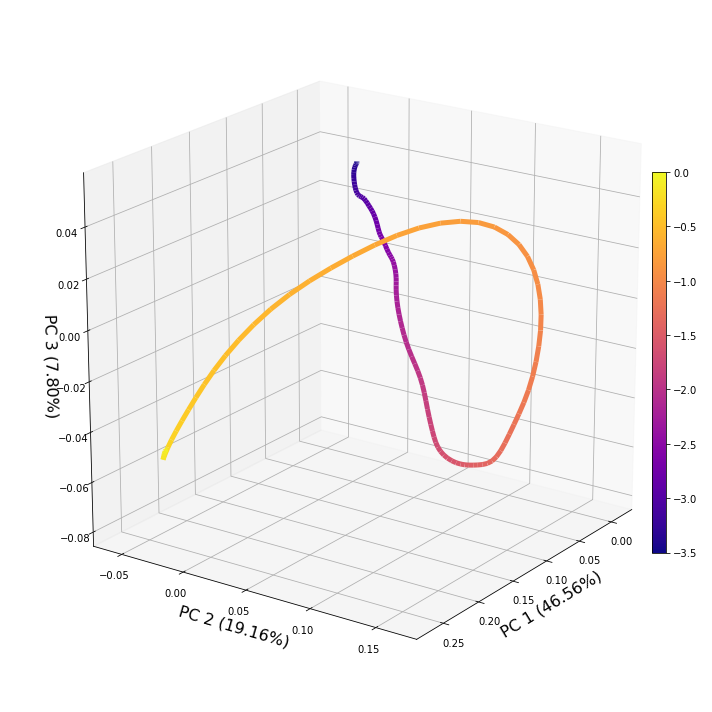

In [52]:
fig = plt.figure(figsize=(10,10))

ax = plt.axes(projection = '3d')

pc1 = pcs[0]
pc1 = pc1 - pc1[20:60].mean()

pc2 = pcs[1]
pc2 = pc2 - pc2[20:60].mean()

pc3 = pcs[2]
pc3 = pc3 - pc3[20:60].mean()


pc1_filt = gaussian_filter1d(pc1,sigma=2)
pc2_filt = gaussian_filter1d(pc2,sigma=2)
pc3_filt = gaussian_filter1d(pc3,sigma=2)

points = np.array([pc1_filt, pc2_filt, pc3_filt]).T.reshape(-1,1,3)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

norm = plt.Normalize(time_fr.min(), time_fr.max())
lc = Line3DCollection(segments, cmap='plasma',norm=norm)

lc.set_array(time_fr)
lc.set_linewidth(5)

line = ax.add_collection(lc)

# ax.plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
#         gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
#         gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0))

ax.set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
ax.set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
ax.set_zlabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
ax.set_xlim((np.min(pc1_filt)-np.std(pc1_filt)*0.2,np.max(pc1_filt)+np.std(pc1_filt)*0.2))
ax.set_ylim((np.min(pc2_filt)-np.std(pc2_filt)*0.2,np.max(pc2_filt)+np.std(pc2_filt)*0.2))
ax.set_zlim((np.min(pc3_filt)-np.std(pc3_filt)*0.2,np.max(pc3_filt)+np.std(pc3_filt)*0.2))

cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().height*0.3,0.02,ax.get_position().height*0.7])
plt.colorbar(line, cax=cax) # Similar to fig.colorbar(im, cax = cax)

ax.view_init(20, 35)

fig.tight_layout()

plt.show()

# TSNE - Nonlinear dimensional reduction

TSNE is a dimensionality reduction technique that preserves local continuity in high-dimensional space. It has been used on various datasets with impressive results. Because the mapping between state-space and neural manifold is likely nonlinear, it might make sense to apply this to the dataset.  

In [26]:
data_pca = {}
models_pca = {}

n_components = 10

NT = psth.shape[-1]

frames = []

for key in data.keys():
    
    if (data[key].shape[0] >= 10) & (data[key].shape[1] > 35):
        
        frames.append(data[key][:,:40,:])

In [27]:
agdata = np.concatenate(frames,axis=0)

n_components = 3
droll = np.reshape(agdata, (agdata.shape[0],-1)) # first 80 bins = 1.6 sec
droll = droll - np.mean(droll, axis=1)[:, np.newaxis]
pcs = TSNE(n_components = n_components,perplexity = 5).fit_transform(droll.T)
pcs = np.reshape(pcs, (n_components, -1, NT))

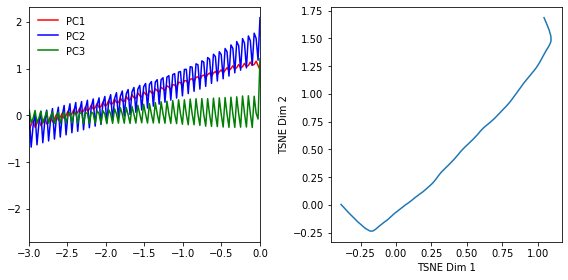

In [34]:
time_fr = np.linspace(-3.5,0,NT)

pc1 = pcs[0]
pc1 = pc1 - pc1[:,20:60].mean(axis=1)[:,np.newaxis]

pc2 = pcs[1]
pc2 = pc2 - pc2[:,20:60].mean(axis=1)[:,np.newaxis]

pc3 = pcs[2]
pc3 = pc3 - pc3[:,20:60].mean(axis=1)[:,np.newaxis]

fig, axs = plt.subplots(1,2,figsize=(8,4))

axs[0].plot(time_fr,gaussian_filter1d(pc1,sigma=1,axis=1).mean(axis=0),'r',label='PC1')
axs[0].plot(time_fr,gaussian_filter1d(pc2,sigma=1,axis=1).mean(axis=0),'b',label='PC2')
axs[0].plot(time_fr,gaussian_filter1d(pc3,sigma=1,axis=1).mean(axis=0),'g',label='PC3')
axs[0].set_xlim((-3,0))
axs[0].legend(frameon=False)


axs[1].plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0))
axs[1].set_xlabel("TSNE Dim 1")
axs[1].set_ylabel("TSNE Dim 2")

plt.tight_layout()
plt.show()

In [31]:
frames = []
pc_list = [pc1,pc2,pc3]


for ii in range(len(pc_list)):
    df_temp = pd.DataFrame({
        'pc':pc_list[ii].reshape(1,-1).T.squeeze(),
        'time':np.tile(time_fr,pc_list[ii].shape[0]),
        'num':f"PC {ii+1}"                          
    })
    frames.append(df_temp)
    
df = pd.concat(frames).reset_index()

df

,index,pc,time,num
0,0,5.061770,-3.500000,PC 1
1,1,0.231289,-3.474820,PC 1
2,2,-2.081747,-3.449640,PC 1
3,3,5.129974,-3.424460,PC 1
4,4,0.252487,-3.399281,PC 1
...,...,...,...,...
16795,5595,-11.977150,-0.100719,PC 3
16796,5596,25.674530,-0.075540,PC 3
16797,5597,-3.801088,-0.050360,PC 3
16798,5598,-12.043682,-0.025180,PC 3


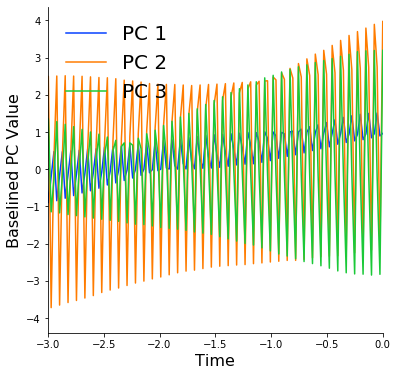

In [33]:
fig, ax = plt.subplots(figsize=(6,6))
sns.lineplot(data=df, x="time", y="pc",
             hue='num',palette = 'bright',ci=None)
sns.despine()


ax.set_xlim((-3,0))
legend = ax.legend(frameon=False,loc='upper left',
         prop={'size':20})
# legend.legendHandles[0]._legmarker.set_markersize(15)

ax.set_xlabel('Time',fontsize=16)
ax.set_ylabel('Baselined PC Value',fontsize=16)

ax.axhline(0,-3,0,linewidth=2)


plt.show()

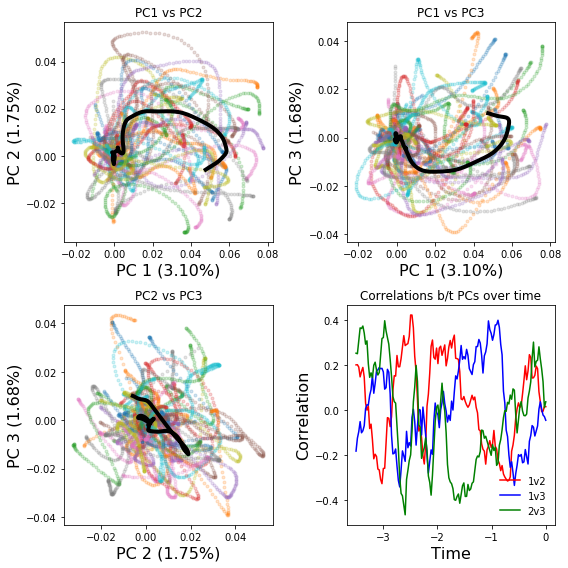

In [381]:
fig, axs = plt.subplots(2,2,figsize=(8,8))

for ii in range(pc1.shape[0]):
    axs[0,0].plot(gaussian_filter1d(pc1,sigma=10,axis=1)[ii,20:],gaussian_filter1d(pc2,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)

#     axs.plot(gaussian_filter1d(pc1,sigma=2,axis=1)[ii,20:],gaussian_filter1d(pc2,sigma=2,axis=1)[ii,20:],'.',alpha=0.2)


axs[0,0].plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
              gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
              'k',linewidth=4)

    
axs[0,0].set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
axs[0,0].set_ylabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
axs[0,0].set_title('PC1 vs PC2')


# Axs 2: PC 1 vs PC 3
for ii in range(pc1.shape[0]):
    axs[0,1].plot(gaussian_filter1d(pc1,sigma=10,axis=1)[ii,20:],gaussian_filter1d(pc3,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)

#     axs.plot(gaussian_filter1d(pc1,sigma=2,axis=1)[ii,20:],gaussian_filter1d(pc2,sigma=2,axis=1)[ii,20:],'.',alpha=0.2)


axs[0,1].plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
              gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0),
              'k',linewidth=4)

    
axs[0,1].set_xlabel(f"PC 1 ({model.explained_variance_ratio_[0]:.2%})",fontsize=16)
axs[0,1].set_ylabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
axs[0,1].set_title('PC1 vs PC3')

# Axs 3: PC 2 vs PC 3
for ii in range(pc1.shape[0]):
    axs[1,0].plot(gaussian_filter1d(pc2,sigma=10,axis=1)[ii,20:],gaussian_filter1d(pc3,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)


axs[1,0].plot(gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
              gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0),
              'k',linewidth=4)

    
axs[1,0].set_xlabel(f"PC 2 ({model.explained_variance_ratio_[1]:.2%})",fontsize=16)
axs[1,0].set_ylabel(f"PC 3 ({model.explained_variance_ratio_[2]:.2%})",fontsize=16)
axs[1,0].set_title('PC2 vs PC3')


## Axs 4: Time-dependent correlations 

pc1v2 = []
for ii in range(pc1.shape[1]):
    pc1v2.append(np.corrcoef(pc1[:,ii].T,pc2[:,ii].T)[1,0])
    
pc1v3 = []
for ii in range(pc1.shape[1]):
    pc1v3.append(np.corrcoef(pc1[:,ii].T,pc3[:,ii].T)[1,0])
    
pc2v3 = []
for ii in range(pc1.shape[1]):
    pc2v3.append(np.corrcoef(pc2[:,ii].T,pc3[:,ii].T)[1,0])
    
axs[1,1].plot(time_fr,pc1v2,'r',label='1v2')
axs[1,1].plot(time_fr,pc1v3,'b',label='1v3')
axs[1,1].plot(time_fr,pc2v3,'g',label='2v3')

axs[1,1].legend(frameon=False)
axs[1,1].set_xlabel("Time",fontsize=16)
axs[1,1].set_ylabel("Correlation",fontsize=16)
axs[1,1].set_title('Correlations b/t PCs over time')


fig.tight_layout()
plt.show()

In [382]:
fig = plt.figure(figsize=(10,10))

ax = plt.axes(projection = '3d')

pc1_filt = gaussian_filter1d(pc1,sigma=2,axis=1).mean(axis=0)
pc2_filt = gaussian_filter1d(pc2,sigma=2,axis=1).mean(axis=0)
pc3_filt = gaussian_filter1d(pc3,sigma=2,axis=1).mean(axis=0)

points = np.array([pc1_filt, pc2_filt, pc3_filt]).T.reshape(-1,1,3)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

norm = plt.Normalize(time_fr.min(), time_fr.max())
lc = Line3DCollection(segments, cmap='plasma',norm=norm)

lc.set_array(time_fr)
lc.set_linewidth(5)

line = ax.add_collection(lc)

# ax.plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
#         gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
#         gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0))

ax.set_xlabel("TSNE Dim 1",fontsize=16)
ax.set_ylabel("TSNE Dim 2",fontsize=16)
ax.set_zlabel("TSNE Dim 3",fontsize=16)
ax.set_xlim((np.min(pc1_filt)-np.std(pc1_filt)*0.2,np.max(pc1_filt)+np.std(pc1_filt)*0.2))
ax.set_ylim((np.min(pc2_filt)-np.std(pc2_filt)*0.2,np.max(pc2_filt)+np.std(pc2_filt)*0.2))
ax.set_zlim((np.min(pc3_filt)-np.std(pc3_filt)*0.2,np.max(pc3_filt)+np.std(pc3_filt)*0.2))

cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().height*0.3,0.02,ax.get_position().height*0.7])
plt.colorbar(line, cax=cax) # Similar to fig.colorbar(im, cax = cax)

ax.view_init(20, 35)

fig.tight_layout()

plt.show()

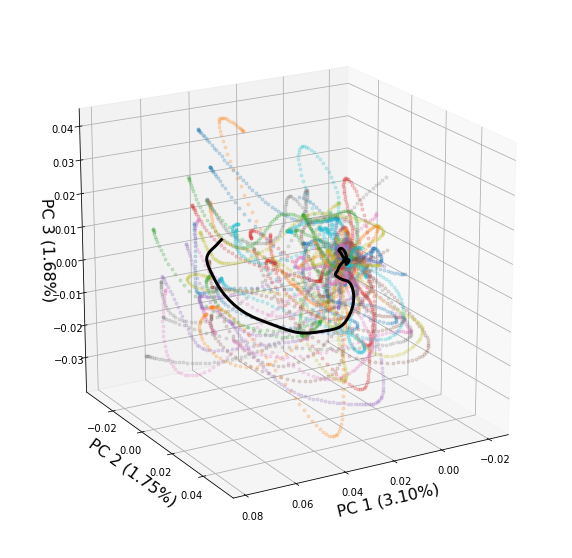

In [385]:
fig = plt.figure(figsize=(10,10))

ax = plt.axes(projection = '3d')

for ii in range(pc1.shape[0]):
    ax.plot(gaussian_filter1d(pc1,sigma=10,axis=1)[ii,20:],
                gaussian_filter1d(pc2,sigma=10,axis=1)[ii,20:],
                gaussian_filter1d(pc3,sigma=10,axis=1)[ii,20:],'.',alpha=0.2)
    
ax.plot(gaussian_filter1d(pc1[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc2[:,20:],sigma=2,axis=1).mean(axis=0),
        gaussian_filter1d(pc3[:,20:],sigma=2,axis=1).mean(axis=0),'k',linewidth=3)

ax.set_xlabel("TSNE Dim 1",fontsize=16)
ax.set_ylabel("TSNE Dim 2",fontsize=16)
ax.set_zlabel("TSNE Dim 3",fontsize=16)
ax.view_init(20, 60)


In [48]:
# Aggregated data

data_pca = {}
models_pca = {}

n_components = 10

NT = psth.shape[-1]

frames = []

for key in data.keys():
    
    if (data[key].shape[0] >= 10) & (data[key].shape[1] > 35):
        frames.append(data[key].mean(axis=1))

In [57]:
agdata = np.concatenate(frames,axis=0)

n_components = 3
droll = np.reshape(agdata, (agdata.shape[0],-1)) # first 80 bins = 1.6 sec
droll = droll - np.mean(droll, axis=1)[:, np.newaxis]
pcs = TSNE(n_components = n_components,perplexity = 8).fit_transform(droll.T)
pcs = np.reshape(pcs, (n_components, NT))

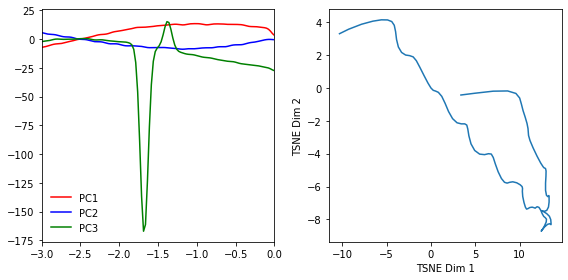

In [58]:
time_fr = np.linspace(-3.5,0,NT)

pc1 = pcs[0]
pc1 = pc1 - pc1[20:60].mean()

pc2 = pcs[1]
pc2 = pc2 - pc2[20:60].mean()

pc3 = pcs[2]
pc3 = pc3 - pc3[20:60].mean()

fig, axs = plt.subplots(1,2,figsize=(8,4))

axs[0].plot(time_fr,gaussian_filter1d(pc1,sigma=2,axis=0),'r',label='PC1')
axs[0].plot(time_fr,gaussian_filter1d(pc2,sigma=2,axis=0),'b',label='PC2')
axs[0].plot(time_fr,gaussian_filter1d(pc3,sigma=2,axis=0),'g',label='PC3')
axs[0].set_xlim((-3,0))
axs[0].legend(frameon=False)


axs[1].plot(gaussian_filter1d(pc1[20:],sigma=2,axis=0),gaussian_filter1d(pc2[20:],sigma=2,axis=0))
axs[1].set_xlabel("TSNE Dim 1")
axs[1].set_ylabel("TSNE Dim 2")

plt.tight_layout()
plt.show()

# SVM Analysis

In [13]:
agdata.shape # 705 neurons, 40 trials, 140 

(705, 40, 140)